# Metabolic Markers

[![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/earmingol/scCellFie/blob/main/docs/source/notebooks/metabolic_markers.ipynb)

In this tutorial, we will walk you through how to identify metabolic markers from single-cell data. We will use different approaches to detect important metabolic tasks that characterize distinct cell types in your dataset.

Here, we will use the results we previously generated for the Human Endometrial Cell Atlas (HECA) dataset [(Mareckova & Garcia-Alonso et al 2023)](https://doi.org/10.1038/s41588-024-01873-w) by running our [Quick Start Tutorial](https://sccellfie.readthedocs.io/en/latest/notebooks/quick_start_human.html).

## This tutorial includes following steps:
* [Loading libraries](#loading-libraries)
* [Loading endometrium results](#loading-endometrium-results)
* [Defining cell types](#defining-cell-types)
* [Identification of metabolic markers](#identification-of-metabolic-markers)
* [Visualizations](#visualizations)

## Loading libraries  <a class="anchor" id="loading-libraries"></a>

In [1]:
import sccellfie
import scanpy as sc

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import glasbey

import textwrap

## To avoid warnings
import warnings
warnings.filterwarnings("ignore")

In addition, we set up a folder to save our figures. This folder is stored in the settings of Scanpy:

In [2]:
sc.settings.figdir = './results/marker-figures/'

## Loading endometrium results <a class="anchor" id="loading-endometrium-results"></a>

We start opening the results previously generated by running the scCellFie pipeline on the HECA dataset. If you haven't run the pipeline yet, please follow [this tutorial](https://sccellfie.readthedocs.io/en/latest/notebooks/quick_start_human.html).

In this case, we will load the objects that were present in ``results['adata']`` in that tutorial. This object contains:
- ``results['adata']``: contains gene expression in ``.X``.
- ``results['adata'].layers['gene_scores']``: contains gene scores as in the original CellFie paper.
- ``results['adata'].uns['Rxn-Max-Genes']``: contains determinant genes for each reaction per cell.
- ``results['adata'].reactions``: contains reaction scores in ``.X`` so every scanpy function can be used on this object to visualize or compare values.
- ``results['adata'].metabolic_tasks``: contains metabolic task scores in ``.X`` so every scanpy function can be used on this object to visualize or compare values.

Here, we will name this object directly as ``adata``. Each of the previous elements should be under ``adata.``, as for example ``adata.metabolic_tasks``.

In [3]:
adata = sccellfie.io.load_adata(folder='./results/',
                                filename='Human_HECA_scCellFie'
                               )

./results//Human_HECA_scCellFie.h5ad was correctly loaded
./results//Human_HECA_scCellFie_reactions.h5ad was correctly loaded
./results//Human_HECA_scCellFie_metabolic_tasks.h5ad was correctly loaded


In this case, we are interested in the metabolic task scores, which can be found in the adata.metabolic_tasks AnnData object.

In [4]:
adata.metabolic_tasks

AnnData object with n_obs × n_vars = 90001 × 215
    obs: 'n_genes', 'sample', 'percent_mito', 'n_counts', 'Endometriosis_stage', 'Endometriosis', 'Hormonal treatment', 'Binary Stage', 'Stage', 'phase', 'dataset', 'Age', 'lineage', 'celltype', 'label_long'
    uns: 'Binary Stage_colors', 'Biopsy_type_colors', 'Endometrial_pathology_colors', 'Endometriosis_stage_colors', 'GarciaAlonso_celltype_colors', 'Group_colors', 'Hormonal treatment_colors', 'Library_genotype_colors', 'Mareckova_celltype_colors', 'Mareckova_epi_celltype_colors', 'Mareckova_lineage_colors', 'Processing_colors', 'Symbol_colors', 'Tan_cellsubtypes_colors', 'Tan_celltype_colors', 'Treatment_colors', 'celltype_colors', 'dataset_colors', 'genotype_colors', 'hvg', 'label_long_colors', 'leiden', 'leiden_R_colors', 'leiden_colors', 'lineage_colors', 'neighbors', 'normalization', 'phase_colors', 'umap'
    obsm: 'X_scVI', 'X_umap'
    obsp: 'connectivities', 'distances'

## Defining cell types <a class="anchor" id="defining-cell-types"></a>

For metabolic marker identification, we need to specify which column in the AnnData object contains the cell type information:

In [5]:
# Our column indicating the cell types in the adata.obs dataframe
cell_group = 'celltype'

Additionally, we use glasbey to expand the palette into a larger number of colors. This is useful when we have many cell types.

In [6]:
palette = glasbey.extend_palette('Set2',
                                 palette_size=max([10, adata.metabolic_tasks.obs[cell_group].unique().shape[0]]))

Which can be visualized as

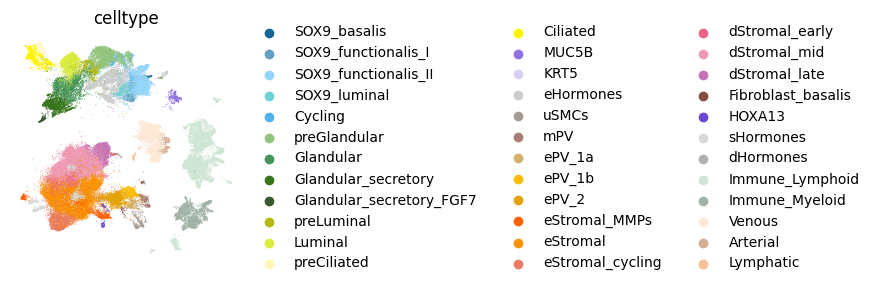

In [17]:
sc.pl.umap(adata, color=cell_group, frameon=False)

## Identification of metabolic markers <a class="anchor" id="identification-of-metabolic-markers"></a>

To identify markers, we can use different approaches. Here we show an approach based on [TF-IDF](https://en.wikipedia.org/wiki/Tf%E2%80%93idf), which comes from the Natural Language Processing field, and the [logistic regression implemented in Scanpy](https://www.nature.com/articles/s41592-018-0303-9).

### Detection using TF-IDF

scCellFie implements a TF-IDF (Term Frequency-Inverse Document Frequency) approach, adapted from the SoupX tool in R. 

We define `express_cut=5*np.log(2)` to determine which cells are expressing each metabolic task. This value (`5*np.log(2)`) indicates that all reactions in the task are over the threshold value of the determinant gene (or "active"). This condition is often rare in single-cell data due to data sparsity (rarely all reactions in a task are over their determinant gene's threshold), but it is a good approach for identifying markers.

In [7]:
mrks = sccellfie.external.quick_markers(adata.metabolic_tasks,
                                        cluster_key=cell_group,
                                        n_markers=20,
                                        express_cut=5*np.log(2))

In [8]:
mrks.head()

,gene,cluster,tf,idf,tf_idf,gene_frequency_outside_cluster,gene_frequency_global,second_best_tf,second_best_cluster,pval,qval
0,Conversion of carnosine to beta-alanine,SOX9_basalis,0.558824,1.588612,0.887754,0.203806,0.204209,0.874235,Luminal,3.835604e-15,0.000000e+00
1,Fructose degradation (to glucose-3-phosphate),SOX9_basalis,0.764706,0.705568,0.539552,0.493521,0.493828,0.913798,preGlandular,1.904306e-08,0.000000e+00
2,3'-Phospho-5'-adenylyl sulfate synthesis,SOX9_basalis,0.127451,2.932873,0.373798,0.053160,0.053244,0.293322,preGlandular,3.009349e-03,0.000000e+00
3,Biosynthesis of Tn_antigen (Glycoprotein N-ace...,SOX9_basalis,0.088235,4.154814,0.366601,0.015606,0.015689,0.088235,SOX9_basalis,3.486177e-05,0.000000e+00
4,Conversion of 1-phosphatidyl-1D-myo-inositol 4...,SOX9_basalis,0.068627,2.717943,0.186526,0.066007,0.066010,0.192308,Lymphatic,5.137296e-01,6.318684e-181


By examining the distributions of TF-IDF scores, we can filter the results to identify more specific tasks:

<Axes: >

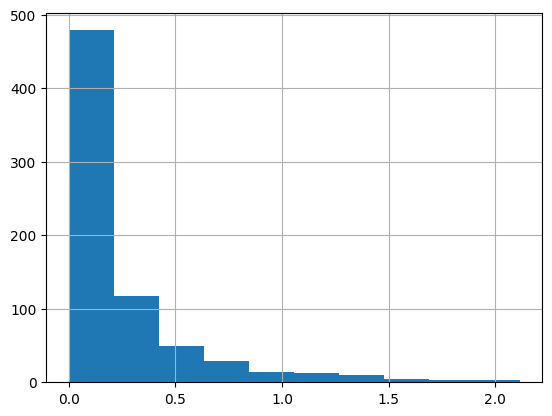

In [9]:
# Visualize TF-IDF score distribution
mrks['tf_idf'].hist()

Text(0, 0.5, 'IDF')

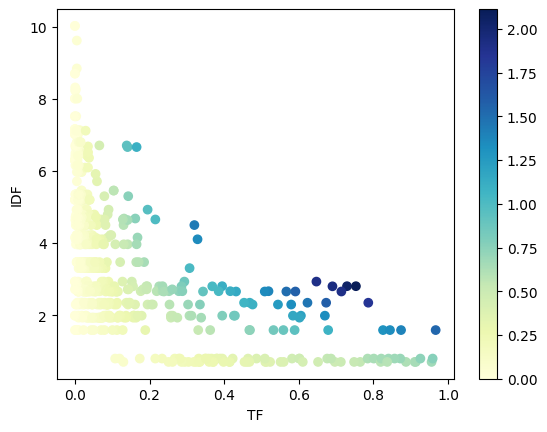

In [10]:
# Scatter plot of TF vs IDF with TF-IDF as color
scatter = plt.scatter(mrks['tf'], mrks['idf'], c=mrks['tf_idf'], cmap='YlGnBu')
plt.colorbar(scatter)
plt.xlabel('TF')
plt.ylabel('IDF')

scCellFie includes a filtering function that fits a hyperbolic curve, while the user can define some thresholds based on the tf-idf scores, and the ratio between the top and second best cell clusters (`tf_ratio`).

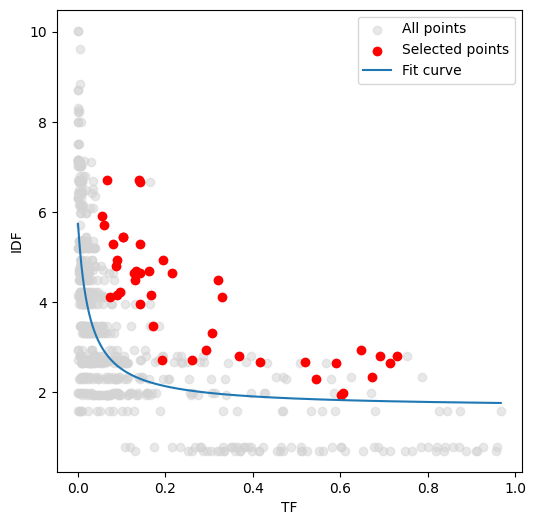

In [11]:
x_col = 'tf'
y_col = 'idf'
df = mrks
tfidf_threshold = 0.3
tf_ratio = 1.2

# Visualization
plt.figure(figsize=(6, 6))
# Plot all points
plt.scatter(df[x_col], df[y_col], alpha=0.5, c='lightgray', label='All points')
# Plot selected points
filtered_mrks, curve = sccellfie.external.filter_tfidf_markers(df, tf_col=x_col, idf_col=y_col, 
                                                              tfidf_threshold=tfidf_threshold, 
                                                              tf_ratio=tf_ratio)
plt.scatter(filtered_mrks[x_col], filtered_mrks[y_col], c='red', label='Selected points')
plt.plot(*curve, label='Fit curve')
plt.xlabel('TF')
plt.ylabel('IDF')
plt.legend()

A detailed list of the selected markers:

In [26]:
filtered_mrks

,gene,cluster,tf,idf,tf_idf,gene_frequency_outside_cluster,gene_frequency_global,second_best_tf,second_best_cluster,pval,qval
3,Biosynthesis of Tn_antigen (Glycoprotein N-ace...,SOX9_basalis,0.088235,4.154814,0.366601,0.015606,0.015689,0.088235,SOX9_basalis,3.486177e-05,0.000000e+00
20,Presence of the thioredoxin system through the...,SOX9_functionalis_I,0.320175,4.499821,1.440732,0.009537,0.011111,0.130323,SOX9_luminal,2.436788e-169,2.436788e-169
41,Biosynthesis of Tn_antigen (Glycoprotein N-ace...,SOX9_functionalis_II,0.167774,4.154814,0.697070,0.009330,0.015689,0.088235,SOX9_basalis,0.000000e+00,0.000000e+00
63,Presence of the thioredoxin system through the...,SOX9_luminal,0.130323,4.499821,0.586428,0.010076,0.011111,0.130323,SOX9_luminal,2.169252e-74,2.436788e-169
67,Conversion of estrone (E1) to estrone sulfate ...,SOX9_luminal,0.073548,4.105754,0.301972,0.015982,0.016478,0.073548,SOX9_luminal,1.432926e-20,1.030451e-259
101,Glucose to lactate conversion,preGlandular,0.544278,2.296725,1.250056,0.083174,0.100588,0.544278,preGlandular,0.000000e+00,0.000000e+00
102,ATP generation from glucose (hypoxic condition...,preGlandular,0.605766,1.987948,1.204232,0.118577,0.136976,0.605766,preGlandular,0.000000e+00,0.000000e+00
103,AMP salvage from adenine,preGlandular,0.601942,1.932106,1.163015,0.126902,0.144843,0.338397,Cycling,0.000000e+00,0.000000e+00
104,3'-Phospho-5'-adenylyl sulfate synthesis,preGlandular,0.293322,2.932873,0.860275,0.043821,0.053244,0.293322,preGlandular,0.000000e+00,0.000000e+00
107,GMP salvage from guanine,preGlandular,0.103854,5.456934,0.566725,0.000358,0.004267,0.017722,Cycling,0.000000e+00,0.000000e+00


In [12]:
# Get unique list of filtered markers
tf_idf_mrks = filtered_mrks['gene'].unique().tolist()
len(tf_idf_mrks)

29

### Detection using Logistic Regression in Scanpy

We can also use logistic regression, as implemented in Scanpy, to identify metabolic markers:

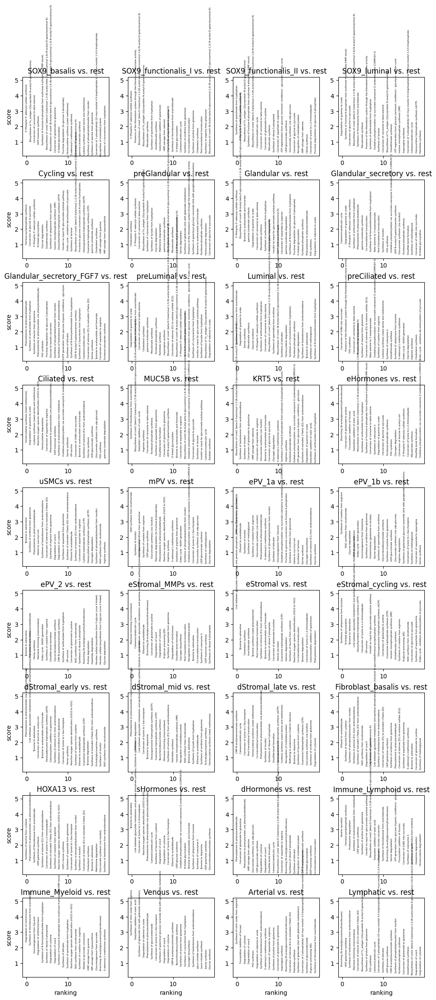

In [20]:
method = 'logreg'
sc.tl.rank_genes_groups(adata.metabolic_tasks, cell_group, method=method,
                       use_raw=False, key_added=method)
sc.pl.rank_genes_groups(adata.metabolic_tasks, n_genes=20, sharey=True, key=method, fontsize=4)

In [21]:
# Get the results as a dataframe
scanpy_df = sc.get.rank_genes_groups_df(adata.metabolic_tasks,
                                      key=method,
                                      group=None)

In [22]:
scanpy_df.head()

,group,names,scores
0,SOX9_basalis,3'-Phospho-5'-adenylyl sulfate synthesis,1.646670
1,SOX9_basalis,Biosynthesis of Tn_antigen (Glycoprotein N-ace...,1.050843
2,SOX9_basalis,Conversion of carnosine to beta-alanine,0.983181
3,SOX9_basalis,GDP-mannose synthesis,0.850716
4,SOX9_basalis,Synthesis of fructose-6-phosphate from erythro...,0.804910


We can visualize these markers using dot plots:

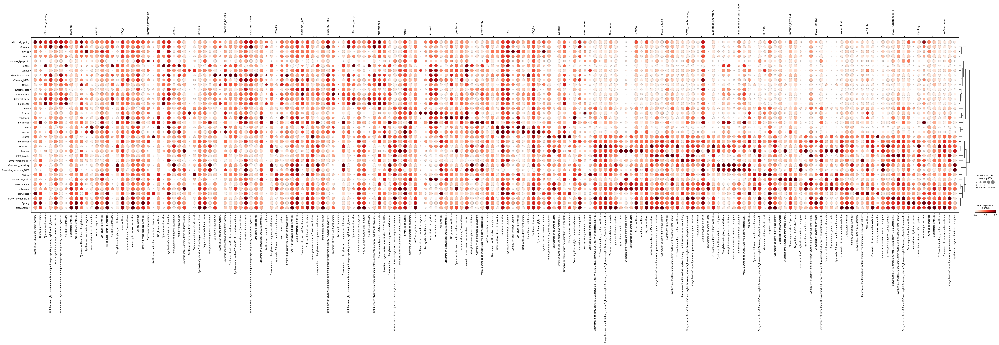

In [27]:
sc.pl.rank_genes_groups_dotplot(adata.metabolic_tasks, n_genes=5, groupby=cell_group,
                               key=method, use_raw=False, standard_scale='var',
                              )

We can filter the logistic regression markers based on their scores:

<Axes: >

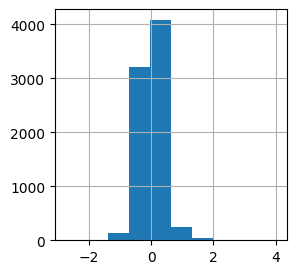

In [28]:
# Visualize score distribution
scanpy_df['scores'].hist()

In [31]:
# Filter based on score threshold
scores_threshold = 1.0
filtered_scanpy_mrks = scanpy_df.loc[scanpy_df['scores'] > scores_threshold]

In [30]:
filtered_scanpy_mrks

,group,names,scores
0,SOX9_basalis,3'-Phospho-5'-adenylyl sulfate synthesis,1.646670
1,SOX9_basalis,Biosynthesis of Tn_antigen (Glycoprotein N-ace...,1.050843
215,SOX9_functionalis_I,3'-Phospho-5'-adenylyl sulfate synthesis,1.249713
430,SOX9_functionalis_II,Synthesis of quinolinate from tryptophan,1.505565
431,SOX9_functionalis_II,3'-Phospho-5'-adenylyl sulfate synthesis,1.135055
...,...,...,...
7101,Venous,Conversion of lysine to L-Saccharopine,1.190897
7102,Venous,Synthesis of galactosyl glucosyl ceramide (lin...,1.069577
7103,Venous,Degradation of uracil,1.018579
7104,Venous,Degradation of cytosine,1.018579


In [32]:
# Convert them to a list
scanpy_mrks = filtered_scanpy_mrks['names'].unique().tolist()
len(scanpy_mrks)

61

## Visualizations <a class="anchor" id="visualizations"></a>

We can combine the metabolic tasks from different approaches:

In [33]:
both_markers = sorted(set(tf_idf_mrks + scanpy_mrks))
len(both_markers)

81

### Select only highly active markers

We can filter the markers based on their activity level by aggregating the metabolic activity to the cell-type level:

In [34]:
# Aggregate the metabolic activity of markers into a cell-type level using trimean
agg = sccellfie.expression.aggregation.agg_expression_cells(adata.metabolic_tasks[:, both_markers],
                                                            groupby=cell_group,
                                                            agg_func='trimean')

Filter markers with an aggregated score of at least 1 in at least one cell type (you can adjust this threshold depending on how strict you want to be).

In [35]:
both_markers = agg.T.loc[(agg.T > 1.).any(axis=1)].index.tolist()
len(both_markers)

46

### UMAP

Now we can visualize these metabolic markers using UMAP:

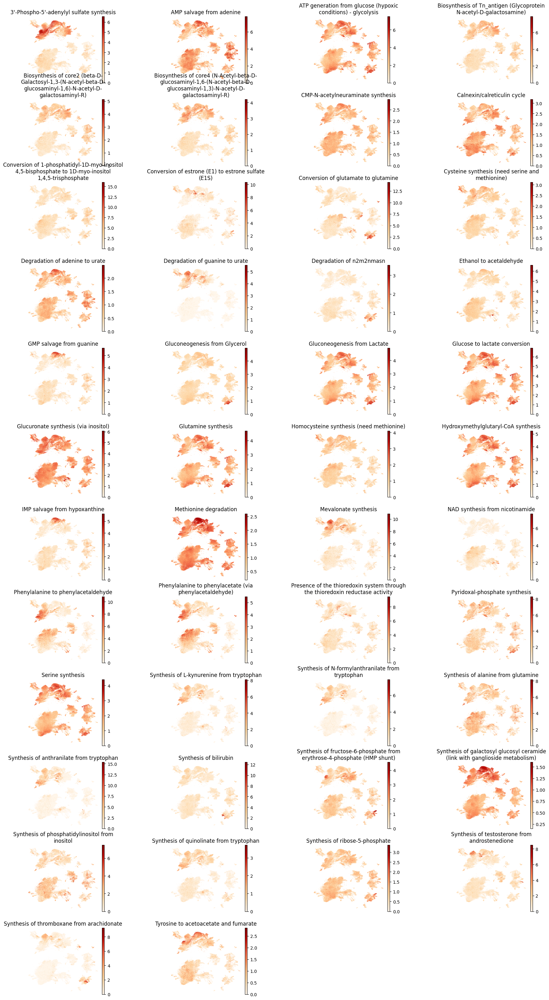

In [39]:
plt.rcParams['figure.figsize'] = (3,3)
plt.rcParams['font.size'] = 10

sc.pl.embedding(adata.metabolic_tasks,
               color=both_markers,
               ncols=4,
               palette=palette,
               frameon=False,
               basis='X_umap',
               wspace=0.7,
               title=["\n".join(textwrap.wrap(t, width=45)) for t in both_markers],
               cmap='OrRd'
              )

### Violin plot

We can further inspect the metabolic score distribution across single cells per cell type for these markers:

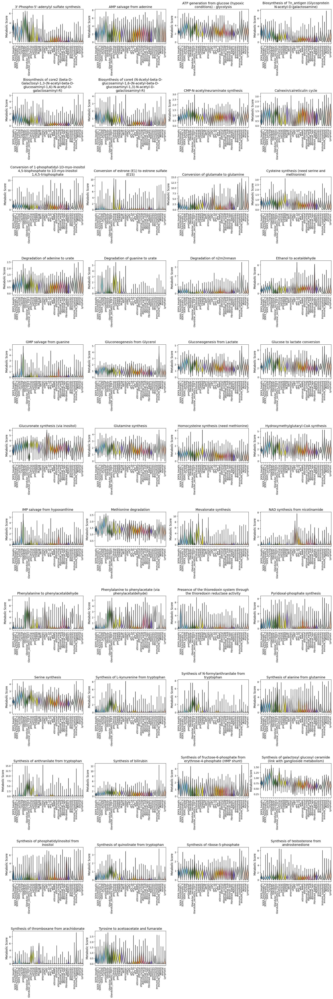

In [40]:
fig, axes = sccellfie.plotting.create_multi_violin_plots(adata.metabolic_tasks,
                                                       features=both_markers,
                                                       groupby=cell_group,
                                                       stripplot=False,
                                                       n_cols=4,
                                                       ylabel='Metabolic Score'
                                                      )

### Heatmap

As a summary visualization, we can create a heatmap of the identified metabolic markers across cell types based on the aggregated scores into a cell-type level (found in ``agg`` calculated before):

In [42]:
filtered_agg = agg[both_markers]

In [43]:
filtered_agg.head()

Task,3'-Phospho-5'-adenylyl sulfate synthesis,AMP salvage from adenine,ATP generation from glucose (hypoxic conditions) - glycolysis,Biosynthesis of Tn_antigen (Glycoprotein N-acetyl-D-galactosamine),"Biosynthesis of core2 (beta-D-Galactosyl-1,3-(N-acetyl-beta-D-glucosaminyl-1,6)-N-acetyl-D-galactosaminyl-R)","Biosynthesis of core4 (N-Acetyl-beta-D-glucosaminyl-1,6-(N-acetyl-beta-D-glucosaminyl-1,3)-N-acetyl-D-galactosaminyl-R)",CMP-N-acetylneuraminate synthesis,Calnexin/calreticulin cycle,"Conversion of 1-phosphatidyl-1D-myo-inositol 4,5-bisphosphate to 1D-myo-inositol 1,4,5-trisphosphate",Conversion of estrone (E1) to estrone sulfate (E1S),...,Synthesis of anthranilate from tryptophan,Synthesis of bilirubin,Synthesis of fructose-6-phosphate from erythrose-4-phosphate (HMP shunt),Synthesis of galactosyl glucosyl ceramide (link with ganglioside metabolism),Synthesis of phosphatidylinositol from inositol,Synthesis of quinolinate from tryptophan,Synthesis of ribose-5-phosphate,Synthesis of testosterone from androstenedione,Synthesis of thromboxane from arachidonate,Tyrosine to acetoacetate and fumarate
Arterial,0.256560,1.675679,2.481569,0.683852,0.442055,0.344145,0.754417,0.773945,2.522644,0.104100,...,0.004131,0.796489,0.466867,0.699921,1.124336,0.031946,0.551582,1.033685,0.045549,0.030364
Ciliated,1.078283,1.451005,1.929947,1.445988,0.892795,0.846883,0.723723,0.565869,1.477182,1.089631,...,0.704579,1.092265,0.682542,0.758055,0.308139,0.291273,0.635575,0.865189,0.193303,0.553913
Cycling,2.098761,3.000086,3.718694,1.807871,1.074159,0.971235,1.017814,1.237260,1.803018,0.326987,...,0.273492,1.119333,1.211169,1.053797,0.542966,0.374733,0.957516,0.769935,0.106314,0.666761
Fibroblast_basalis,0.240646,1.469132,2.305450,0.710848,0.304962,0.355424,0.744974,0.695407,1.322372,0.140297,...,0.000000,0.951126,0.491220,0.580029,1.478609,0.081673,0.513473,1.045122,0.000000,0.026769
Glandular,3.829955,1.562031,2.227763,1.779426,1.111685,1.377226,0.908321,0.626390,1.595914,0.025143,...,2.093063,1.597565,0.794605,0.812703,0.527581,0.565066,0.695606,0.675938,0.201555,0.747315


We then apply min-max normalization for better visualization:

In [46]:
normalized_markers = sccellfie.preprocessing.min_max_normalization(filtered_agg, axis=0)

Followed by the heatmap

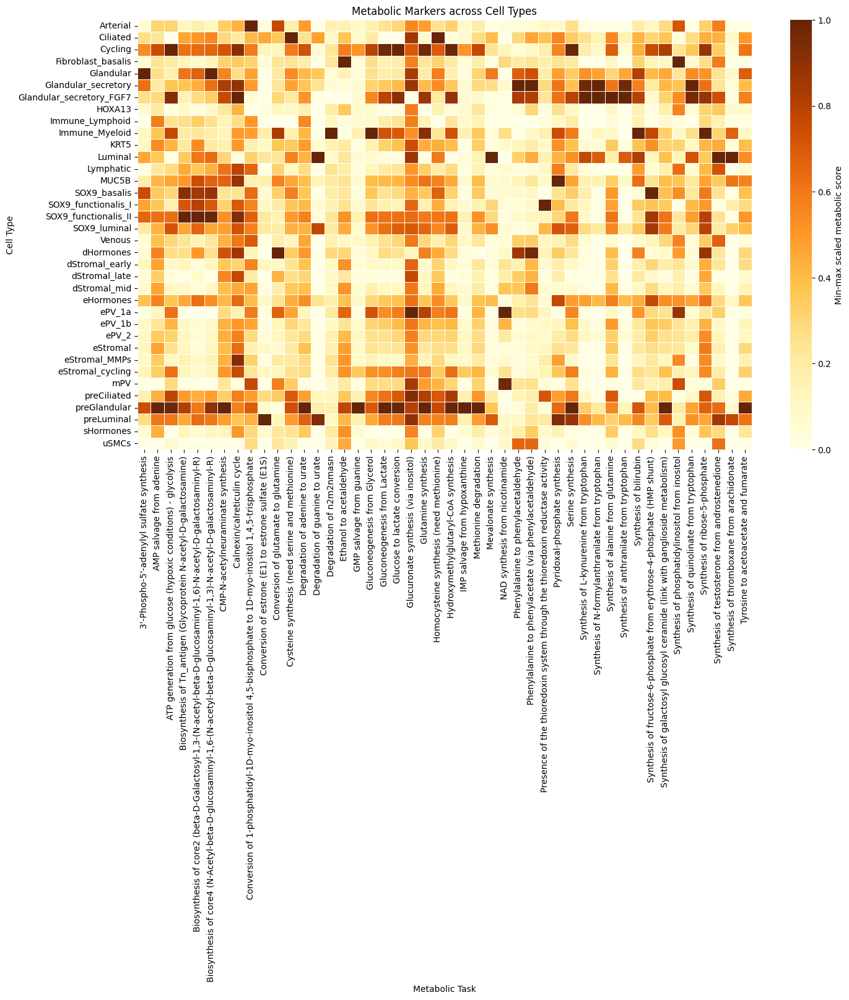

In [50]:
# Create heatmap
plt.figure(figsize=(16, 9))
sns.heatmap(normalized_markers, cmap='YlOrBr', annot=False, linewidths=0.5, 
            cbar_kws={'label': 'Min-max scaled metabolic score'})

plt.title('Metabolic Markers across Cell Types')
plt.ylabel('Cell Type')
plt.xlabel('Metabolic Task')
plt.tight_layout()